## Modules

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.stats.multitest as smt
from fastprogress.fastprogress import  progress_bar
from scipy import stats
import itertools

import _utils

In [2]:
import session_info
session_info.show()

In [45]:
sc.set_figure_params(scanpy=True, fontsize=26, dpi=300)

## Read in anndata

In [3]:
adata_vis = _utils.read_visium('/nfs/team205/heart/anndata_objects/8regions/visium-OCT_adult-8reg_raw.h5ad')
category_name = 'annotation_final'
adata_vis

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 55049 × 22055
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc', 'annotation_final', 'Adip1', 'Adip2', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_act', 'CD4+T_naive', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'FB1', 'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6', 'ILC', 'LYVE1+IGF1+MP', 'LYVE1+MP_cycling', 'LYVE1+TIMD4+MP', 'MAIT-like', 'Mast', 'MoMP', 'NC1_glial', 'NC2

## DEGs in the epicardium-subepicardium

In [25]:
def rank_genes_groups_to_df(adata, cell):
    
    dic = adata.uns['rank_genes_groups'] 
    
    df = pd.DataFrame({
        'names' : dic['names'][cell],
        'scores' : dic['scores'][cell],
        'pvals' : dic['pvals'][cell],
        'pvals_adj' : dic['pvals_adj'][cell],
        'logfoldchanges' : dic['logfoldchanges'][cell]
    })
    
    return df

# rank_genes_groups_to_df(sanp, 'SAN_P_cell')

In [23]:
regions = ['RV','LV','RA','LA']

adata_sub = adata_vis[adata_vis.obs['region'].isin(regions)]
adata_sub

View of AnnData object with n_obs × n_vars = 27514 × 22055
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc', 'annotation_final', 'Adip1', 'Adip2', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_act', 'CD4+T_naive', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'FB1', 'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6', 'ILC', 'LYVE1+IGF1+MP', 'LYVE1+MP_cycling', 'LYVE1+TIMD4+MP', 'MAIT-like', 'Mast', 'MoMP', 'NC1_glia

In [24]:
# DE test
sc.tl.rank_genes_groups(adata_sub,groupby='annotation_final',groups=['epicardium_subepicardium'],ref='all',method='wilcoxon')

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'annotation_final' as categorical


In [70]:
res = rank_genes_groups_to_df(adata_sub, cell='epicardium_subepicardium')

# select significant genes
res = res[res['pvals_adj']<0.05]
res = res[res['logfoldchanges']>1.5]
res

,names,scores,pvals,pvals_adj,logfoldchanges
0,FTL,60.900749,0.000000,0.000000,1.942685
1,EEF1A1,52.874229,0.000000,0.000000,1.737559
2,MGP,50.398411,0.000000,0.000000,1.991854
3,S100A6,47.812077,0.000000,0.000000,1.500306
4,FBLN1,47.529964,0.000000,0.000000,2.500369
...,...,...,...,...,...
799,CCL5,2.766883,0.005660,0.042601,1.907944
803,LIF,2.756073,0.005850,0.043930,3.827921
804,EPS8L2,2.753821,0.005890,0.044158,1.765681
805,CD200,2.750273,0.005955,0.044609,2.313036


## DE antimicrobial genes

In [71]:
# read in antimicrobial genes
module = pd.read_table('/nfs/team205/kk18/data/geneset/GO/QuickGO_GO0019730_antimicrobial-humoral-response.tsv')
module = set(module['SYMBOL'])

# select DEGs
epi_antimicro_genes = [x for x in module if x in list(res['names'])]
epi_antimicro_genes.sort()
epi_antimicro_genes

['CCL13',
 'CCL18',
 'CCL19',
 'CCL21',
 'CXCL1',
 'CXCL14',
 'CXCL8',
 'IGHA1',
 'IGHM',
 'JCHAIN',
 'RARRES2',
 'SLPI',
 'TF']

Trying to set attribute `.uns` of view, copying.
... storing 'annotation_final' as categorical


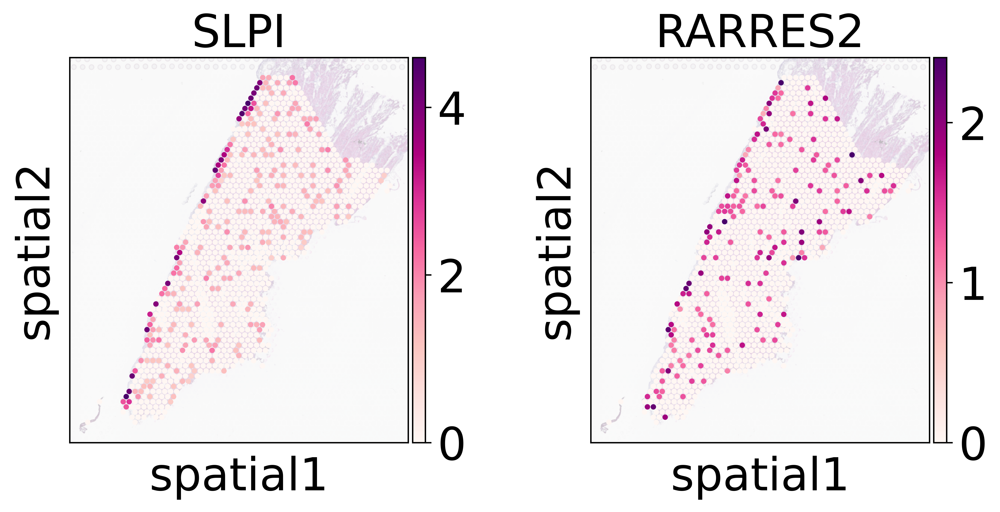

In [81]:
slide=_utils.select_multislide(adata_vis,['HCAHeartST8795940'])

sc.pl.spatial(slide,cmap='RdPu',
              color=['SLPI','RARRES2'], 
              ncols=6, wspace=0.2,hspace=0.5,
          size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.9',legend_loc=None,
         )

Trying to set attribute `.uns` of view, copying.
... storing 'annotation_final' as categorical


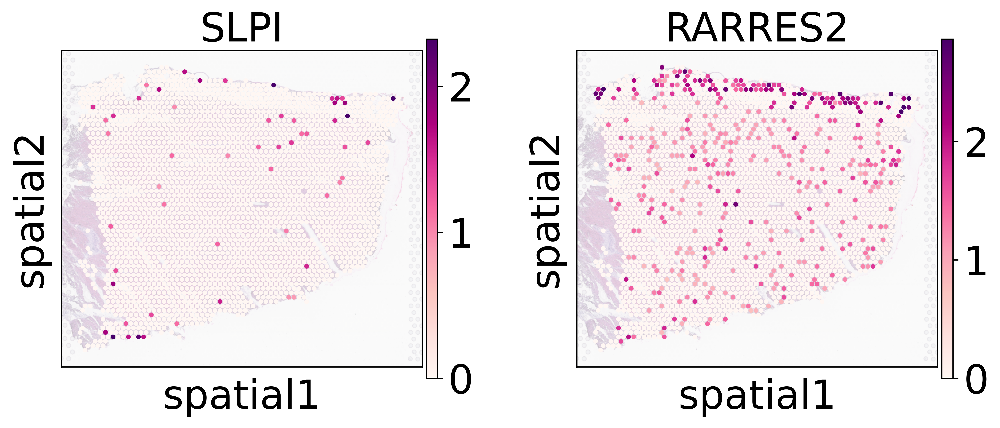

In [75]:
slide=_utils.select_multislide(adata_vis,['HCAHeartST8795933'])

sc.pl.spatial(slide,cmap='RdPu',
              color=['SLPI','RARRES2'], 
              ncols=6, wspace=0.3,hspace=0.5,
          size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.9',legend_loc=None,
         )

Trying to set attribute `.uns` of view, copying.
... storing 'annotation_final' as categorical


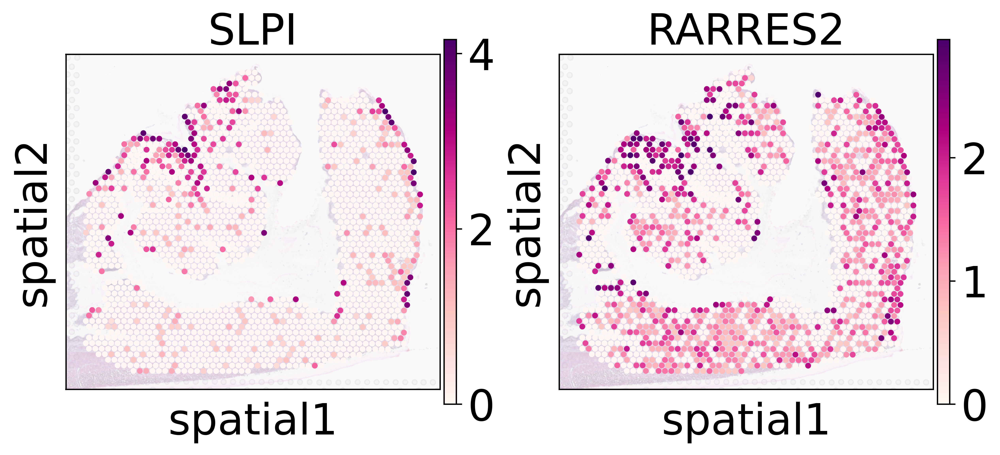

In [80]:
slide=_utils.select_multislide(adata_vis,['HCAHeartST8795934'])

sc.pl.spatial(slide,cmap='RdPu',
              color=['SLPI','RARRES2'], 
              ncols=6, wspace=0.2,hspace=0.5,
          size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.9',legend_loc=None,
         )

Trying to set attribute `.uns` of view, copying.
... storing 'annotation_final' as categorical


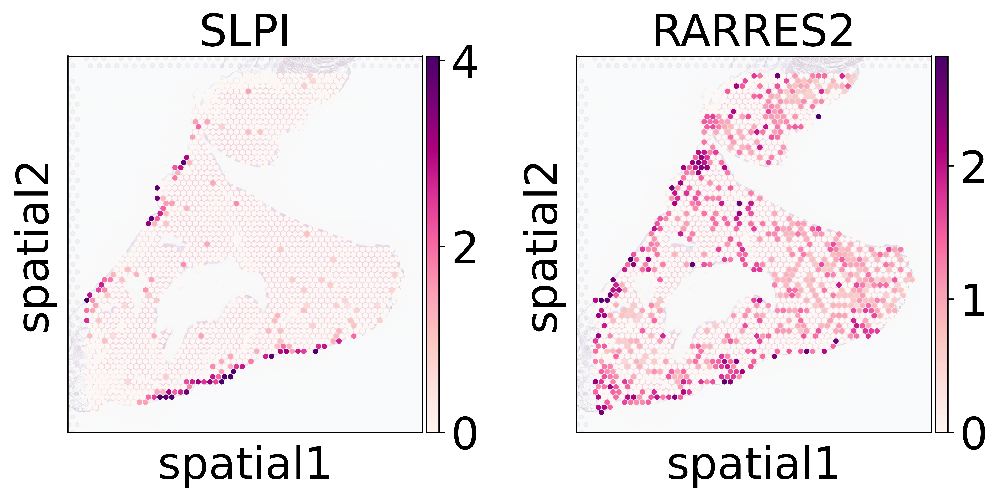

In [79]:
slide=_utils.select_multislide(adata_vis,['HCAHeartST10238252'])

sc.pl.spatial(slide,cmap='RdPu',
              color=['SLPI','RARRES2'], 
              ncols=6, wspace=0.2,hspace=0.5,
          size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.9',legend_loc=None,
         )